<a href="https://colab.research.google.com/github/xiao-yucheng0625/ML-100-DAY/blob/main/Smoking_Status_Predictio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Dataset Description

The dataset for this homework (both train and test) was generated from a deep learning model trained on the Smoker Status Prediction using Bio-Signals dataset.

However, individual use of these factors for prediction could lead to conflicting results that were not straightforward enough for the physicians and patients to interpret and apply. Providing a prediction model might be a favorable way to understand the chance of quitting smoking for each individual smoker. Health outcome prediction models had been developed using methods of machine learning over recent years.

Your task is to help them create a machine learning model to identify the smoking status of an individual using bio-signals.

## Data Column
* age : 5-years gap
* height(cm)
* weight(kg)
* waist(cm) : Waist circumference length
* eyesight(left)
* eyesight(right)
* hearing(left)
* hearing(right)
* systolic : Blood pressure
* relaxation : Blood pressure
* fasting blood sugar
* Cholesterol : total
* triglyceride
* HDL : cholesterol type
* LDL : cholesterol type
* hemoglobin
* Urine protein
* serum creatinine
* AST : glutamic oxaloacetic transaminase type
* ALT : glutamic oxaloacetic transaminase type
* Gtp : γ-GTP
* dental caries
* smoking


## 2.1 導入pandas庫，並讀取三個 CSV 文件
1. 比賽訓練集
2. 比賽測試集
3. 原始數據集

In [111]:
import pandas as pd
train_df = pd.read_csv('/content/train.csv') # 比賽訓練數據（經微調）
copy_train_df = train_df.copy() # 建立副本，便於在 train_df 上做任意操作
test_df = pd.read_csv('/content/test.csv') # 比賽測試數據（經微調）
original_train_df = pd.read_csv('/content/original_train_dataset.csv') # 原始訓練數據

## 2.2 刪除 ID 列，並與原始訓練數據合併，然後隨機打亂

查看 df.info
* 檢查缺失值
* 檢查數據類型
* 檢查數據大小

In [112]:
train_df= train_df.drop(['id'],axis=1) # 刪除 ID 行
test_df= test_df.drop(['id'],axis=1) # 刪除 ID 行
train_df = pd.concat([train_df, original_train_df]).sample(frac=1) # 合併訓練集
y = train_df['smoking']

## 2.3 去除重複數據

移除訓練集中的重複數據

In [113]:
train_df.duplicated().sum()

np.int64(5517)

In [114]:
train_df = train_df.drop_duplicates()
train_df.duplicated().sum()

np.int64(0)

移除測試集中的重複數據

In [115]:
test_df.duplicated().sum()

np.int64(0)

In [116]:
test_df = test_df.drop_duplicates()
test_df.duplicated().sum()

np.int64(0)

# 3. Feature Engineering

## 3.1 通過組合和轉換原始特徵創建了新的特徵，這些新特徵具有更強的生物醫學意義
* 計算體重指數(BMI)，體重(kg) / 身高(m)²
* 計算腰圍與身高比

In [117]:
import numpy as np

In [118]:
train_df['BMI'] = train_df['weight(kg)'] / (train_df['height(cm)'].replace(0, np.nan) / 100) ** 2
train_df['waist_height_ratio'] = train_df['waist(cm)'] / train_df['height(cm)']
train_df['average_eyesight'] = (train_df['eyesight(left)'] + train_df['eyesight(right)']) / 2
train_df['average_hearing'] = (train_df['hearing(left)'] + train_df['hearing(right)']) / 2
train_df['cholesterol_ratio'] = train_df['HDL'] / train_df['LDL']

<ipython-input-118-2a56e6dd1cae>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-118-2a56e6dd1cae>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-118-2a56e6dd1cae>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-118-2a5

In [119]:
test_df['BMI'] = test_df['weight(kg)'] / (test_df['height(cm)'].replace(0, np.nan) / 100) ** 2
test_df['waist_height_ratio'] = test_df['waist(cm)'] / test_df['height(cm)']
test_df['average_eyesight'] = (test_df['eyesight(left)'] + test_df['eyesight(right)']) / 2
test_df['average_hearing'] = (test_df['hearing(left)'] + test_df['hearing(right)']) / 2
test_df['cholesterol_ratio'] = test_df['HDL'] / test_df['LDL']

## 3.2 數據標準化處理

In [120]:
# --- 標準化數值特徵 ---
# 建立 StandardScaler 物件
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

# 對訓練集的數值特徵進行擬合和轉換
train_df_scaled = scaler.fit_transform(train_df.drop(['hearing(left)', 'hearing(right)', 'Urine protein','dental caries', 'smoking'],axis =1))

# 對測試集的數值特徵進行轉換 (使用訓練集的擬合結果)
test_df_scaled = scaler.transform(test_df.drop(['hearing(left)', 'hearing(right)', 'Urine protein','dental caries'], axis =1))

# 4. Exploratory Data Analysis (EDA)

## 4.1 針對訓練集以及測試集進行描述性統計

對 train_df 中的所有欄位（不論數值型或類別型）計算描述性統計。

In [121]:
train_stat_summ = train_df.describe(include='all').T.reset_index()

對 test_df 中的所有欄位（不論數值型或類別型）計算描述性統計。

In [122]:
test_stat_summ = test_df.describe(include='all').T.reset_index()

In [123]:
# Train Numerical Columns
for col in train_df.columns:
    print(f"-------------------{col}-------------------")
    print(f"Minimum Value: {train_stat_summ.loc[train_stat_summ['index'] == col]['min'].values[0]}")
    print(f"Maximum Value: {train_stat_summ.loc[train_stat_summ['index'] == col]['max'].values[0]}")
    print(f"Mean Value: {train_stat_summ.loc[train_stat_summ['index'] == col]['mean'].values[0]:.2f}")
    print(f"Median Value: {train_stat_summ.loc[train_stat_summ['index'] == col]['50%'].values[0]}")
    print(f"25th Percentile Value: {train_stat_summ.loc[train_stat_summ['index'] == col]['25%'].values[0]}")
    print(f"75th Percentile Value: {train_stat_summ.loc[train_stat_summ['index'] == col]['75%'].values[0]}")

-------------------age-------------------
Minimum Value: 20.0
Maximum Value: 85.0
Mean Value: 43.75
Median Value: 40.0
25th Percentile Value: 40.0
75th Percentile Value: 50.0
-------------------height(cm)-------------------
Minimum Value: 130.0
Maximum Value: 190.0
Mean Value: 164.67
Median Value: 165.0
25th Percentile Value: 160.0
75th Percentile Value: 170.0
-------------------weight(kg)-------------------
Minimum Value: 30.0
Maximum Value: 135.0
Mean Value: 65.43
Median Value: 65.0
25th Percentile Value: 55.0
75th Percentile Value: 75.0
-------------------waist(cm)-------------------
Minimum Value: 51.0
Maximum Value: 129.0
Mean Value: 81.54
Median Value: 81.0
25th Percentile Value: 75.3
75th Percentile Value: 87.0
-------------------eyesight(left)-------------------
Minimum Value: 0.1
Maximum Value: 9.9
Mean Value: 1.02
Median Value: 1.0
25th Percentile Value: 0.8
75th Percentile Value: 1.2
-------------------eyesight(right)-------------------
Minimum Value: 0.0
Maximum Value: 9.9


In [124]:
for col in test_df.columns:
    print(f"-------------------{col}-------------------")
    print(f"Minimum Value: {test_stat_summ.loc[test_stat_summ['index'] == col]['min'].values[0]}")
    print(f"Maximum Value: {test_stat_summ.loc[test_stat_summ['index'] == col]['max'].values[0]}")
    print(f"Mean Value: {test_stat_summ.loc[test_stat_summ['index'] == col]['mean'].values[0]:.2f}")
    print(f"Median Value: {test_stat_summ.loc[test_stat_summ['index'] == col]['50%'].values[0]}")
    print(f"25th Percentile Value: {test_stat_summ.loc[test_stat_summ['index'] == col]['25%'].values[0]}")
    print(f"75th Percentile Value: {test_stat_summ.loc[test_stat_summ['index'] == col]['75%'].values[0]}")

-------------------age-------------------
Minimum Value: 20.0
Maximum Value: 85.0
Mean Value: 42.78
Median Value: 40.0
25th Percentile Value: 40.0
75th Percentile Value: 50.0
-------------------height(cm)-------------------
Minimum Value: 140.0
Maximum Value: 190.0
Mean Value: 164.60
Median Value: 165.0
25th Percentile Value: 160.0
75th Percentile Value: 170.0
-------------------weight(kg)-------------------
Minimum Value: 40.0
Maximum Value: 115.0
Mean Value: 64.17
Median Value: 65.0
25th Percentile Value: 55.0
75th Percentile Value: 70.0
-------------------waist(cm)-------------------
Minimum Value: 58.0
Maximum Value: 117.0
Mean Value: 80.20
Median Value: 80.0
25th Percentile Value: 75.0
75th Percentile Value: 85.4
-------------------eyesight(left)-------------------
Minimum Value: 0.1
Maximum Value: 2.0
Mean Value: 1.03
Median Value: 1.0
25th Percentile Value: 0.8
75th Percentile Value: 1.2
-------------------eyesight(right)-------------------
Minimum Value: 0.1
Maximum Value: 9.9


## 4.2 查看各變數的分布狀況

輸入特徵

In [125]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [126]:
for col in train_df.columns:
    fig = make_subplots(rows = 1, cols = 2, subplot_titles = [f'Histogram of {col}', f'Boxplot of {col}'])
    fig.add_trace(go.Histogram(x = train_df[col], name = col), row = 1, col = 1)
    fig.add_trace(go.Box(x = train_df[col], name = col), row = 1, col = 2)
    fig.update_layout(showlegend = False, title = {'text': f"Univariate Analysis on {col}", 'xanchor':'center', 'x':0.5})
    fig.show()

抽菸分布狀況，0 為不會抽菸、1 為會抽菸

In [127]:
import matplotlib.pyplot as plt
import seaborn as sns

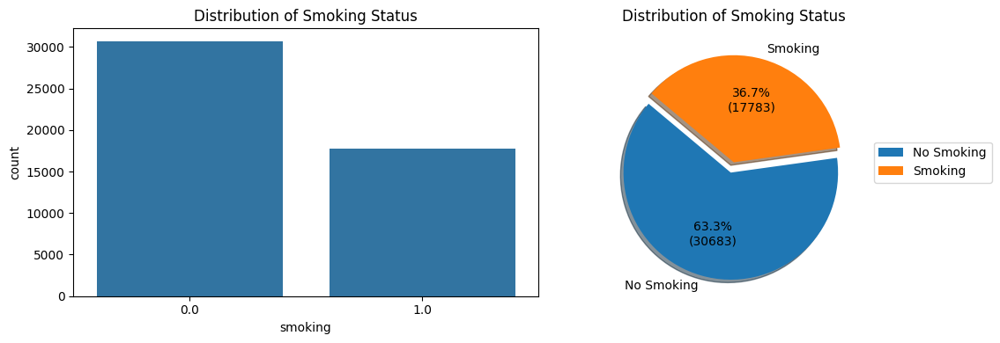

In [128]:
LABELS = ['No Smoking', 'Smoking']
Uniq_vals = train_df['smoking'].value_counts().sort_index().values

def func(pct, allvalues):
    absolute = int(pct / 100. * np.sum(allvalues))
    return "{:.1f}%\n({:d})".format(pct, absolute)

plt.figure(figsize=(12, 4))

# plot 1: 柱狀圖
plt.subplot(1, 2, 1)
sns.countplot(data=train_df, x='smoking')
plt.title('Distribution of Smoking Status')

# plot 2: 圓餅圖
plt.subplot(1, 2, 2)
plt.pie(Uniq_vals,
        labels=LABELS,
        autopct=lambda pct: func(pct, Uniq_vals),
        shadow=True,
        explode=(0.1, 0),
        startangle=140)

plt.legend(loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))
plt.title('Distribution of Smoking Status')
plt.tight_layout()
plt.show()

## 4.3 建立 correlation matrix 確認個變數間的關係

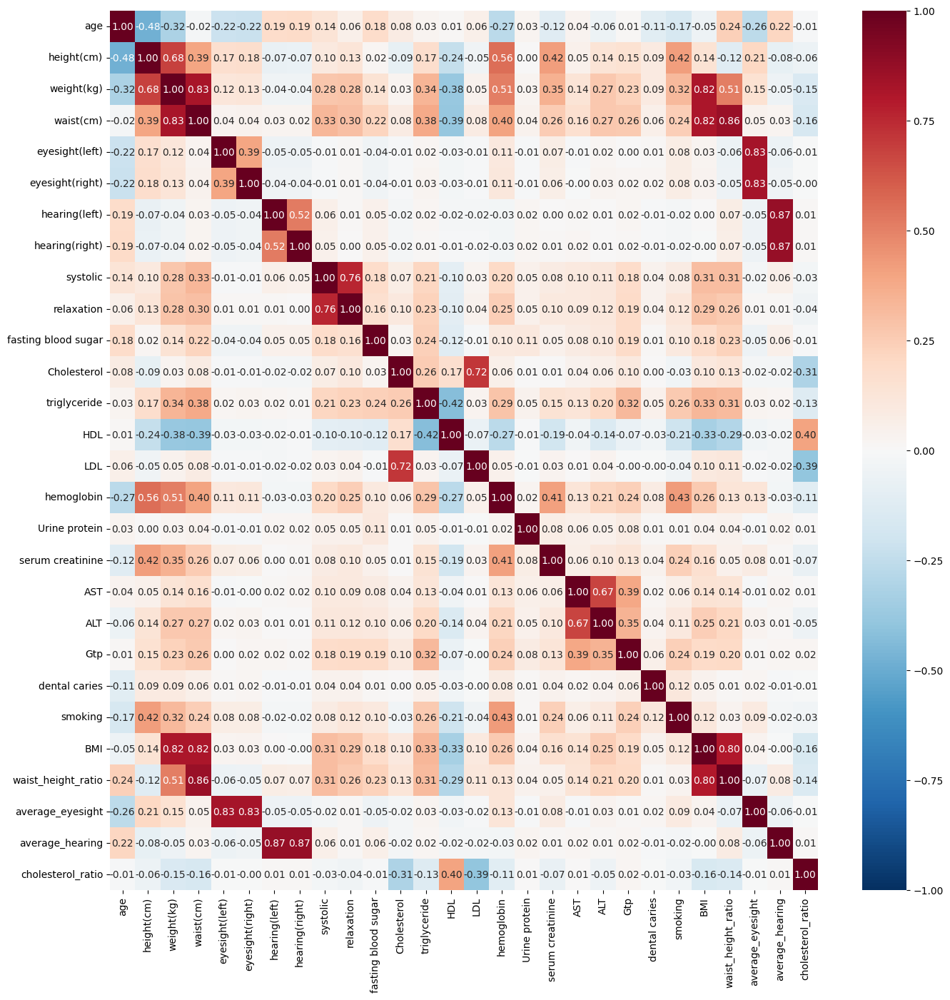

In [129]:
plt.figure(figsize=(16,16))
cor = train_df.corr()
sns.heatmap(cor, annot=True, fmt=".2f", vmin=-1, vmax=1, center=0, cmap="RdBu_r")
plt.show()

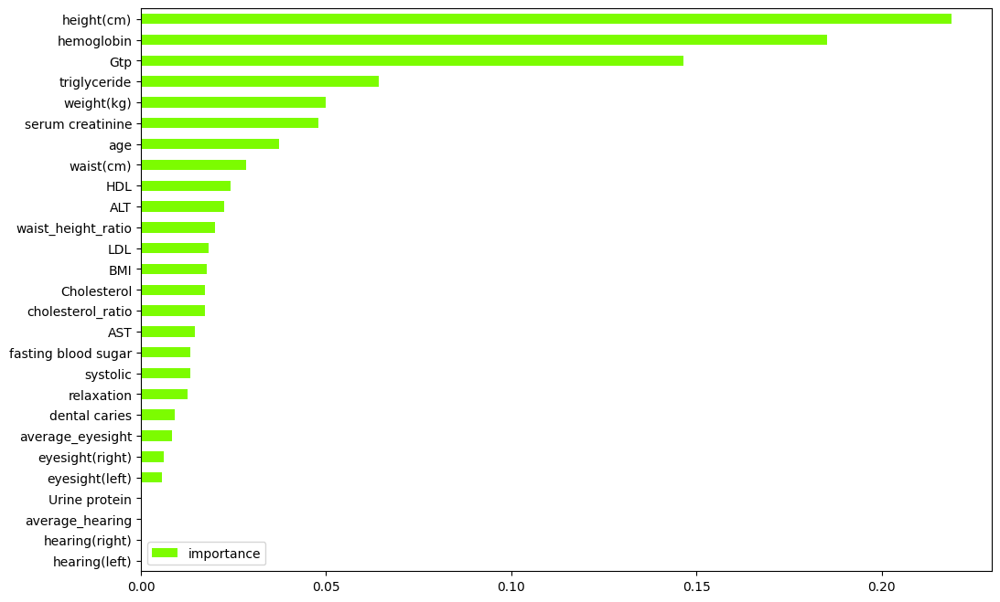

In [130]:
from sklearn.ensemble import RandomForestClassifier
best_forest = RandomForestClassifier(
    n_estimators=75,
    min_samples_split=82,
    min_samples_leaf=11,
    max_depth=26,
    random_state=26,
)

X = train_df.drop(columns=["smoking"])
y = train_df["smoking"]

best_forest.fit(X, y)
importance = best_forest.feature_importances_

feature_importance = pd.DataFrame(data=importance, index=X.columns, columns=['importance']) \
    .sort_values(ascending=True, by='importance')

feature_importance.plot(kind='barh', figsize=(12, 8), color='LawnGreen');

## 4.4 Feature selection

移除與 smoking 輸出變數較小關聯的特徵

In [131]:
# Compute absolute Pearson correlation between numeric features and target
corr = train_df.corr()['smoking'].abs().sort_values(ascending=False)
# Define threshold: drop features with correlation below 0.1
threshold = 0.1
low_corr_features = corr[corr < threshold].index.tolist()
# Exclude target itself
low_corr_features = [f for f in low_corr_features if f != 'smoker_status']
print(f"Dropping {len(low_corr_features)} low-correlation features: {low_corr_features}")
# Drop from train and test (if present)
train_df.drop(columns=[f for f in low_corr_features if f in train_df.columns], inplace=True)
test_df.drop(columns=[f for f in low_corr_features if f in test_df.columns], inplace=True)

Dropping 14 low-correlation features: ['fasting blood sugar', 'average_eyesight', 'systolic', 'eyesight(right)', 'eyesight(left)', 'AST', 'LDL', 'waist_height_ratio', 'cholesterol_ratio', 'Cholesterol', 'average_hearing', 'hearing(left)', 'hearing(right)', 'Urine protein']


# 5. Preprocessing data

## 5.1 使用 Z‑score 移除離群值
快速判斷哪些值相對於該特徵的分佈極端，預設 3（即超過 ±3σ 視為離群）。

In [132]:
num_rows_before = train_df.shape[0]
print(f"Number of data points before removing outliers: {num_rows_before}")

Number of data points before removing outliers: 48467


In [133]:
from scipy import stats

def remove_outliers(df, columns_to_filter, threshold=3):
    for col in columns_to_filter:
        # Calculate the Z-scores for each data point
        z_scores = np.abs(stats.zscore(df[col]))

        # Identify and remove outliers based on the threshold
        df = df[(z_scores < threshold)]

    return df

# Get the remaining numeric features after the correlation-based feature selection
numeric_features = train_df.select_dtypes(include=np.number).columns.tolist()
# Remove the target variable ('smoking') from the list of numeric features
numeric_features.remove('smoking')
#Remove any features that might have been dropped in previous steps
features_to_drop = ['hearing(left)', 'hearing(right)', 'Urine protein','dental caries']
numeric_features = [f for f in numeric_features if f not in features_to_drop]

# Now apply the outlier removal function
train_df = remove_outliers(train_df, columns_to_filter=numeric_features)

In [134]:
num_rows_after = train_df.shape[0]
print(f"Number of data removed: {num_rows_before - num_rows_after} rows")

Number of data removed: 3887 rows


# 6. Building XGBOOST

## 6.1 資料分割-訓練集、驗證集

In [135]:
from sklearn.model_selection import train_test_split
X = train_df.drop(columns=["smoking"])
y = train_df["smoking"]
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

## 6.2 XGBOOST 模型訓練以及搜索最佳超參數設定

In [136]:
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, classification_report

In [137]:
param_grid = {'n_estimators' : [3000,4000,5000, 7000, 9000, 15000],
    'learning_rate': [0.001, 0.01, 0.05, 0.1, 0.2],
    'max_depth': [1, 2, 3, 4, 5, 6],
    'min_child_weight': [1, 2, 3, 4, 5, 6],
    'gamma': [0, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
    'reg_alpha': [0, 0.01, 0.1, 1],
    'reg_lambda': [0, 0.01, 0.1, 1]
}

classifier = xgb.XGBClassifier(objective='binary:logistic', tree_method="gpu_hist")

random_search = RandomizedSearchCV(classifier, param_grid, cv=10, scoring='roc_auc').fit(X_train, y_train)

print("Best hyperparameters:", random_search.best_params_)
best_model = random_search.best_estimator_

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[06:15:31] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[06:15:38] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[06:15:38] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[06:15:44] WARNI

Best hyperparameters: {'subsample': 1.0, 'reg_lambda': 0.01, 'reg_alpha': 0, 'n_estimators': 7000, 'min_child_weight': 5, 'max_depth': 2, 'learning_rate': 0.05, 'gamma': 0, 'colsample_bytree': 1.0}


In [138]:
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
y_pred = best_model.predict(X_val)
y_proba = best_model.predict_proba(X_val)[:, 1]
val_accuracy = accuracy_score(y_val, y_pred)
val_roc_auc = roc_auc_score(y_val, y_proba)
print("Validation Accuracy:", val_accuracy)
print("Validation ROC AUC:", val_roc_auc)
print("Confusion Matrix (counts):")
cm = confusion_matrix(y_val, y_pred)
print(cm)

Validation Accuracy: 0.7607671601615074
Validation ROC AUC: 0.8422100446059154
Confusion Matrix (counts):
[[4595 1119]
 [1014 2188]]


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[06:28:58] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"




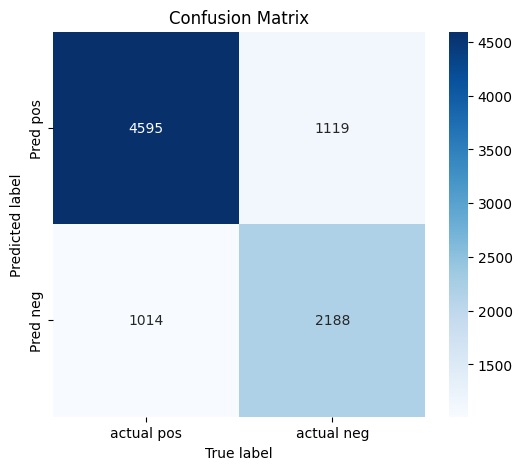

In [139]:
# Plot confusion matrix
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            yticklabels=["Pred pos","Pred neg"],
            xticklabels=["actual pos","actual neg"])
plt.ylabel('Predicted label')
plt.xlabel('True label')
plt.title('Confusion Matrix')
plt.show()

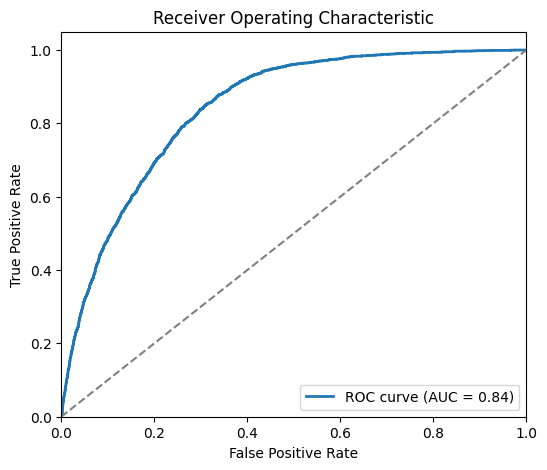

In [140]:
fpr, tpr, _ = roc_curve(y_val, y_proba)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(6,5))
plt.plot(fpr, tpr, lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0,1], [0,1], linestyle='--', color='grey')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

# 7. 模型在測試集的表現

In [141]:
import pandas as pd

# Load the test data
test_df = pd.read_csv('/content/test.csv')

# Feature Engineering to match training data
test_df['BMI'] = test_df['weight(kg)'] / (test_df['height(cm)'].replace(0, np.nan) / 100) ** 2
test_df['waist_height_ratio'] = test_df['waist(cm)'] / test_df['height(cm)']
test_df['average_eyesight'] = (test_df['eyesight(left)'] + test_df['eyesight(right)']) / 2
test_df['average_hearing'] = (test_df['hearing(left)'] + test_df['hearing(right)']) / 2
test_df['cholesterol_ratio'] = test_df['HDL'] / test_df['LDL']

# Select only the features used during training
# Get the list of features used in training
training_features = X_train.columns  # Assuming X_train was used for training

# Select only these features from the test data
test_df_for_prediction = test_df[['id'] + list(training_features)]
#added id column

# Now predict using the modified test data
y_proba = best_model.predict_proba(test_df_for_prediction.drop(columns=['id']))[:, 1]

submission_df = pd.DataFrame({'id': test_df['id'], 'smoking': y_proba})
submission_df.to_csv('submission.csv', index=False)